<a href="https://colab.research.google.com/github/ankithrox2003/Camouflage_project/blob/main/YOLOV8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Install Ultralytics YOLOv8
!pip install ultralytics -q

# Import required libraries
import torch
from ultralytics import YOLO
import os
import shutil
import random
import yaml
import matplotlib.pyplot as plt


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 74.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 55.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' 

In [ ]:
# Define paths
BASE_PATH = "/content/drive/My Drive/YoloV8Final"
DATA_PATH = os.path.join(BASE_PATH, "data")
IMAGES_PATH_TRAIN = os.path.join(DATA_PATH, "images", "train")
IMAGES_PATH_VAL = os.path.join(DATA_PATH, "images", "val")
LABELS_PATH_TRAIN = os.path.join(DATA_PATH, "labels", "train")
LABELS_PATH_VAL = os.path.join(DATA_PATH, "labels", "val")
DATA_YAML_PATH = os.path.join(BASE_PATH, "data.yaml")
MODEL_SAVE_PATH = os.path.join(BASE_PATH, "trained_models")

# Create folder to save trained models if not exists
os.makedirs(MODEL_SAVE_PATH, exist_ok=True)

# Fix data.yaml
correct_yaml = f"""path: {DATA_PATH}
train: images/train
val: images/val
nc: 4  # Replace with actual number of classes
names: ["Person", "Aummunitions", "suspect","Vehicle"]  # Replace with actual class names
"""

with open(DATA_YAML_PATH, "w") as file:
    file.write(correct_yaml)

print("✅ Updated data.yaml!")


✅ Updated data.yaml!


Training images available: 722
Validation images available: 71


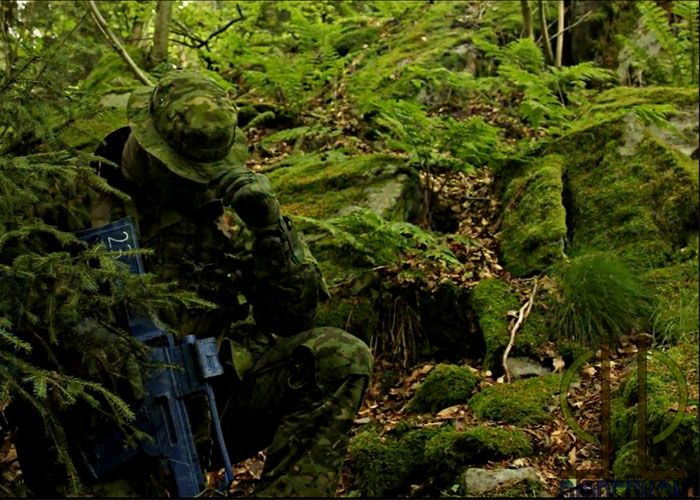

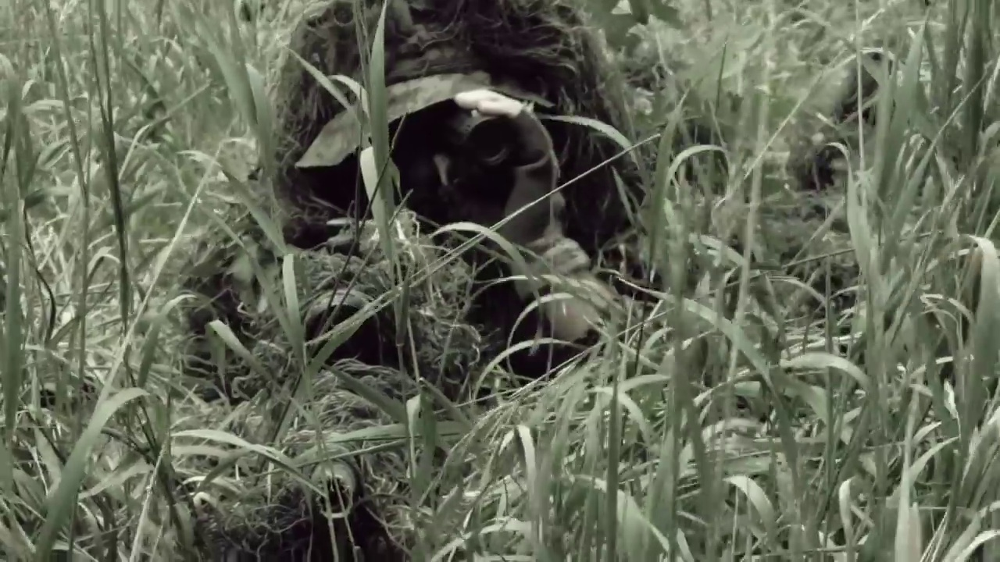

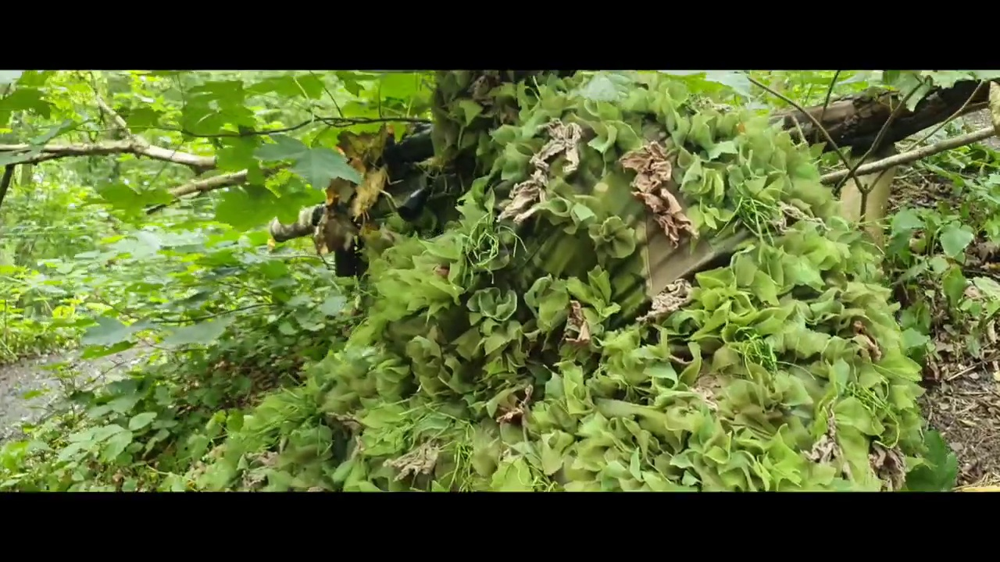

In [ ]:
import random
import cv2
from google.colab.patches import cv2_imshow

# List some images
train_images = os.listdir(IMAGES_PATH_TRAIN)
val_images = os.listdir(IMAGES_PATH_VAL)

# Display a few training images
print(f"Training images available: {len(train_images)}")
print(f"Validation images available: {len(val_images)}")

# Show 3 random validation images
sample_images = random.sample(val_images, min(3, len(val_images)))

for img_name in sample_images:
    img_path = os.path.join(IMAGES_PATH_VAL, img_name)
    image = cv2.imread(img_path)
    cv2_imshow(image)


In [ ]:
from ultralytics import YOLO
import os

# Path to the saved models and data
DATA_YAML_PATH = "data.yaml"
MODEL_SAVE_PATH = "Yolov8Final"

# Variants for YOLOv8 models
variants = ["n", "s", "m", "l", "x"]
results = {}

# Function to drop a layer from the model
def drop_layer(model, layer_name="conv", layer_index=-1):
    layers = model.model[-1]  # The last part of the model is the head (classification layer)

    if layer_name == "conv":  # Example: remove convolutional layer
        # Drop a convolutional layer from the list
        print(f"Dropping convolutional layer {layer_index}")
        layers = layers[:layer_index] + layers[layer_index + 1:]

    # Reassign the modified layers back to the model
    model.model[-1] = layers  # Replace with the modified layer set

    return model

# Loop through each YOLOv8 variant and modify it by dropping a layer
for variant in variants:
    print(f"🚀 Training YOLOv8{variant}...")

    # Load the pre-trained model
    model = YOLO(f"yolov8{variant}.pt")  # Load the YOLOv8 model variant

    # Drop a layer from the model (for example, drop a specific layer from the head or body)
    model = drop_layer(model, layer_name="conv", layer_index=-2)  # Example: dropping a layer by index

    # Proceed with training the modified model
    result = model.train(
        data=DATA_YAML_PATH,
        epochs=50,
        imgsz=640,
        batch=16,
        name=f"yolov8{variant}_modified_training",
        project=MODEL_SAVE_PATH
    )

    results[variant] = result  # Store the training results
    model.save(os.path.join(MODEL_SAVE_PATH, f"yolov8{variant}_modified.pt"))  # Save the trained model

    print(f"✅ Finished training YOLOv8{variant}, model saved.")


🚀 Training YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 282MB/s]


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/My Drive/YoloV8Final/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/YoloV8Final/trained_models, name=yolov8n_training6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

100%|██████████| 755k/755k [00:00<00:00, 102MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 426MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/My Drive/YoloV8Final/data/labels/train.cache... 700 images, 20 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/My Drive/YoloV8Final/data/labels/val.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.29G      1.944      3.239      1.967         53        640: 100%|██████████| 45/45 [00:30<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:11<00:00,  3.68s/it]

                   all         71         92    0.00717      0.652     0.0791      0.037



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.07G       1.82      2.766      1.932         58        640: 100%|██████████| 45/45 [00:05<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.98it/s]

                   all         71         92      0.129       0.22       0.14     0.0628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.07G      1.822      2.677      1.951         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.71it/s]

                   all         71         92      0.489      0.368      0.289       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.07G      1.816      2.601      1.937         62        640: 100%|██████████| 45/45 [00:04<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.16it/s]

                   all         71         92      0.191      0.481      0.225     0.0896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.07G       1.84      2.537      1.947         59        640: 100%|██████████| 45/45 [00:04<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.31it/s]

                   all         71         92      0.407       0.31      0.268      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.07G      1.813      2.424      1.886         50        640: 100%|██████████| 45/45 [00:05<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.37it/s]

                   all         71         92        0.6      0.324      0.341       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.06G      1.788      2.341      1.844         40        640: 100%|██████████| 45/45 [00:05<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.50it/s]

                   all         71         92      0.353      0.331      0.272     0.0929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.08G      1.763      2.309      1.872         57        640: 100%|██████████| 45/45 [00:05<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.13it/s]

                   all         71         92      0.302      0.425      0.292      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.07G      1.747      2.255      1.842         51        640: 100%|██████████| 45/45 [00:05<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.31it/s]

                   all         71         92      0.471       0.51      0.498      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.07G      1.738      2.196      1.817         56        640: 100%|██████████| 45/45 [00:04<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.53it/s]

                   all         71         92      0.424      0.522      0.472      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.06G      1.679      2.151      1.805         56        640: 100%|██████████| 45/45 [00:04<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.62it/s]

                   all         71         92      0.549      0.672      0.631      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.07G      1.673       2.05      1.775         50        640: 100%|██████████| 45/45 [00:05<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.48it/s]

                   all         71         92      0.591      0.579      0.626      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.1G      1.672      2.017      1.771         53        640: 100%|██████████| 45/45 [00:04<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.89it/s]

                   all         71         92      0.537      0.584      0.568      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.07G      1.672      1.983      1.749         40        640: 100%|██████████| 45/45 [00:05<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.03it/s]

                   all         71         92      0.635      0.537      0.627      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.07G      1.645      1.907       1.75         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.20it/s]

                   all         71         92      0.711      0.503      0.643      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.07G      1.631      1.843      1.701         46        640: 100%|██████████| 45/45 [00:05<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.44it/s]

                   all         71         92      0.702      0.634      0.728      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.07G      1.628      1.839      1.693         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.27it/s]

                   all         71         92      0.723      0.669      0.741      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.07G      1.571      1.801      1.694         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.11it/s]

                   all         71         92      0.604      0.564      0.623      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.07G      1.576      1.781      1.686         53        640: 100%|██████████| 45/45 [00:04<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.41it/s]

                   all         71         92      0.723      0.636      0.749      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.07G      1.574      1.764      1.681         65        640: 100%|██████████| 45/45 [00:05<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.12it/s]

                   all         71         92      0.682      0.714      0.774      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.07G      1.535      1.704      1.651         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.37it/s]

                   all         71         92      0.828      0.676      0.836        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.07G      1.528      1.659      1.644         47        640: 100%|██████████| 45/45 [00:04<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.72it/s]

                   all         71         92      0.884      0.753      0.858      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.07G      1.508      1.671      1.623         63        640: 100%|██████████| 45/45 [00:05<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.83it/s]

                   all         71         92      0.955      0.702       0.87      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.07G      1.491      1.632      1.601         46        640: 100%|██████████| 45/45 [00:05<00:00,  8.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.17it/s]

                   all         71         92      0.762      0.766      0.837      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.07G      1.477      1.539      1.587         53        640: 100%|██████████| 45/45 [00:05<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.14it/s]

                   all         71         92      0.814      0.807      0.843      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.07G      1.482      1.577      1.592         42        640: 100%|██████████| 45/45 [00:05<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.35it/s]

                   all         71         92      0.861      0.739      0.874      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.07G      1.463      1.581      1.588         52        640: 100%|██████████| 45/45 [00:05<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.43it/s]

                   all         71         92      0.793      0.739      0.869      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.07G      1.448      1.514      1.551         55        640: 100%|██████████| 45/45 [00:05<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.92it/s]

                   all         71         92      0.892      0.856       0.93      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.05G      1.437      1.484      1.551         49        640: 100%|██████████| 45/45 [00:05<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.59it/s]

                   all         71         92      0.785      0.778      0.872      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.07G      1.428      1.528      1.564         46        640: 100%|██████████| 45/45 [00:05<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.36it/s]

                   all         71         92      0.878        0.8      0.896      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.07G      1.412       1.45      1.542         47        640: 100%|██████████| 45/45 [00:05<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.00it/s]

                   all         71         92      0.854      0.802      0.898      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.07G      1.386       1.41      1.528         55        640: 100%|██████████| 45/45 [00:05<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.32it/s]

                   all         71         92       0.83       0.84      0.919      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.07G      1.351      1.403      1.516         56        640: 100%|██████████| 45/45 [00:05<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.49it/s]

                   all         71         92      0.895      0.858      0.927      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       2.1G      1.343      1.339      1.477         39        640: 100%|██████████| 45/45 [00:05<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.99it/s]

                   all         71         92      0.877      0.905      0.929      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.07G       1.38      1.355      1.518         43        640: 100%|██████████| 45/45 [00:05<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.38it/s]

                   all         71         92      0.895      0.889      0.948      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.07G      1.319      1.333      1.464         51        640: 100%|██████████| 45/45 [00:05<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.83it/s]

                   all         71         92      0.884      0.881       0.94      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.05G      1.317      1.293       1.47         50        640: 100%|██████████| 45/45 [00:05<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.40it/s]

                   all         71         92      0.951      0.885      0.956      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.07G      1.306      1.266      1.467         49        640: 100%|██████████| 45/45 [00:05<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.38it/s]

                   all         71         92      0.942      0.868      0.965      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.07G      1.297      1.268      1.462         53        640: 100%|██████████| 45/45 [00:05<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.10it/s]

                   all         71         92       0.87      0.953       0.96      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.1G      1.291      1.251      1.459         57        640: 100%|██████████| 45/45 [00:05<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.51it/s]

                   all         71         92      0.908      0.914      0.964       0.69


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.22G      1.303      1.164      1.524         23        640: 100%|██████████| 45/45 [00:07<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.74it/s]

                   all         71         92       0.94       0.91      0.977      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.06G      1.211      1.026      1.434         21        640: 100%|██████████| 45/45 [00:05<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.33it/s]

                   all         71         92      0.925      0.905      0.968      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.06G      1.193      1.005      1.432         20        640: 100%|██████████| 45/45 [00:05<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.51it/s]

                   all         71         92       0.94      0.913      0.967      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.06G       1.17      0.972      1.425         28        640: 100%|██████████| 45/45 [00:05<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.19it/s]

                   all         71         92      0.934      0.897      0.962      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.05G      1.164     0.9468      1.404         30        640: 100%|██████████| 45/45 [00:05<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.74it/s]

                   all         71         92      0.974       0.89      0.979      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.07G      1.146     0.9383      1.405         25        640: 100%|██████████| 45/45 [00:05<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.45it/s]

                   all         71         92      0.965      0.905      0.981      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.06G      1.099     0.9073       1.35         27        640: 100%|██████████| 45/45 [00:05<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.23it/s]

                   all         71         92      0.957      0.909      0.977       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.06G      1.099     0.8861      1.352         18        640: 100%|██████████| 45/45 [00:05<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.57it/s]

                   all         71         92      0.929       0.94      0.976      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.05G      1.099     0.8791      1.374         22        640: 100%|██████████| 45/45 [00:05<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.39it/s]

                   all         71         92      0.934      0.947       0.98      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.06G       1.05     0.8581      1.329         22        640: 100%|██████████| 45/45 [00:05<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.10it/s]

                   all         71         92      0.943      0.943      0.984      0.758



50 epochs completed in 0.101 hours.
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6/weights/best.pt, 6.2MB

Validating /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]


                   all         71         92      0.942      0.943      0.984      0.758
                Person         24         28      0.987      0.893      0.988      0.802
          Aummunitions         13         16      0.923      0.938      0.974      0.719
               suspect         47         48      0.917          1      0.989      0.754
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/My Drive/YoloV8Final/trained_models/yolov8n_training6
✅ Finished training YOLOv8n, model saved.
🚀 Training YOLOv8s...


100%|██████████| 21.5M/21.5M [00:01<00:00, 22.4MB/s]

Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/My Drive/YoloV8Final/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/YoloV8Final/trained_models, name=yolov8s_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

 12                  -1  1    591360  ultralytics.nn.modules.block.C2f             [768, 256, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 16                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

train: Scanning /content/drive/My Drive/YoloV8Final/data/labels/train.cache... 700 images, 20 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloV8Final/data/labels/val.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.04G      1.968      3.013      2.008         53        640: 100%|██████████| 45/45 [00:08<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all         71         92      0.309      0.368      0.307      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.84G       1.87      2.375      1.889         58        640: 100%|██████████| 45/45 [00:07<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.04it/s]

                   all         71         92      0.148      0.322      0.141     0.0431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.87G      1.873      2.299      1.943         52        640: 100%|██████████| 45/45 [00:07<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.87it/s]

                   all         71         92      0.528      0.119      0.108     0.0398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.86G       1.94      2.333      1.991         62        640: 100%|██████████| 45/45 [00:07<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.57it/s]

                   all         71         92      0.237      0.239      0.168     0.0637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.81G      1.926      2.359      2.034         59        640: 100%|██████████| 45/45 [00:07<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.02it/s]

                   all         71         92      0.255      0.511      0.363      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.84G      1.862      2.246      1.917         50        640: 100%|██████████| 45/45 [00:07<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.26it/s]

                   all         71         92      0.575      0.376      0.357       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.84G      1.839      2.192      1.896         40        640: 100%|██████████| 45/45 [00:07<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.88it/s]

                   all         71         92      0.456      0.635      0.447      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.86G      1.811      2.237      1.912         57        640: 100%|██████████| 45/45 [00:07<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.34it/s]

                   all         71         92      0.551      0.451      0.415      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.83G      1.825      2.146      1.892         51        640: 100%|██████████| 45/45 [00:07<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.28it/s]

                   all         71         92      0.685      0.409       0.49      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.84G      1.772      2.084      1.852         56        640: 100%|██████████| 45/45 [00:07<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.13it/s]

                   all         71         92      0.566      0.467      0.493      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.84G      1.733      2.044      1.844         56        640: 100%|██████████| 45/45 [00:07<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.66it/s]

                   all         71         92      0.383      0.601      0.539      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.83G      1.732       2.01      1.849         50        640: 100%|██████████| 45/45 [00:07<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.42it/s]

                   all         71         92       0.58      0.543      0.629      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.83G      1.718      1.975      1.849         53        640: 100%|██████████| 45/45 [00:07<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.76it/s]

                   all         71         92      0.494       0.66       0.63      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.85G      1.704      1.922      1.801         40        640: 100%|██████████| 45/45 [00:07<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.63it/s]

                   all         71         92      0.828      0.561      0.701      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.86G      1.649      1.844      1.776         52        640: 100%|██████████| 45/45 [00:07<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.36it/s]

                   all         71         92      0.752      0.607      0.715      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.84G      1.628      1.821      1.742         46        640: 100%|██████████| 45/45 [00:07<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.69it/s]

                   all         71         92      0.645      0.609      0.651      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.82G       1.65       1.78       1.74         52        640: 100%|██████████| 45/45 [00:07<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.75it/s]

                   all         71         92      0.666      0.708      0.762      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.85G      1.609      1.818      1.754         52        640: 100%|██████████| 45/45 [00:07<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.94it/s]

                   all         71         92       0.68      0.651      0.736      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.86G      1.575      1.746      1.721         53        640: 100%|██████████| 45/45 [00:07<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.01it/s]

                   all         71         92      0.681      0.728      0.798      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.83G      1.569      1.704      1.701         65        640: 100%|██████████| 45/45 [00:07<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.03it/s]

                   all         71         92      0.728      0.666       0.76      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.83G      1.556       1.66      1.697         52        640: 100%|██████████| 45/45 [00:07<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.51it/s]

                   all         71         92      0.843      0.704      0.801      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.86G      1.547      1.604      1.674         47        640: 100%|██████████| 45/45 [00:07<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.36it/s]

                   all         71         92      0.911      0.697      0.832      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.83G      1.512      1.588      1.662         63        640: 100%|██████████| 45/45 [00:07<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.57it/s]

                   all         71         92      0.885      0.767      0.871      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.85G      1.495      1.553      1.654         46        640: 100%|██████████| 45/45 [00:07<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.92it/s]

                   all         71         92      0.853      0.736      0.852      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.83G      1.476      1.482      1.607         53        640: 100%|██████████| 45/45 [00:07<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         71         92       0.82      0.728      0.824      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.84G      1.467      1.495      1.601         42        640: 100%|██████████| 45/45 [00:07<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         71         92      0.826      0.791      0.892      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.84G      1.447      1.456      1.592         52        640: 100%|██████████| 45/45 [00:07<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.70it/s]

                   all         71         92      0.821      0.836      0.908      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.83G       1.44      1.428      1.576         55        640: 100%|██████████| 45/45 [00:07<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.53it/s]

                   all         71         92       0.85      0.823       0.89      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.81G      1.432      1.392      1.583         49        640: 100%|██████████| 45/45 [00:07<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.93it/s]

                   all         71         92      0.926       0.82      0.935      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.86G      1.398      1.381       1.57         46        640: 100%|██████████| 45/45 [00:07<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         71         92      0.878      0.786      0.895      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.85G      1.391      1.353       1.54         47        640: 100%|██████████| 45/45 [00:07<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.31it/s]

                   all         71         92      0.873      0.804      0.915       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.84G      1.375      1.316      1.536         55        640: 100%|██████████| 45/45 [00:07<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.21it/s]

                   all         71         92      0.849      0.843       0.93      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.81G      1.317      1.289      1.515         56        640: 100%|██████████| 45/45 [00:07<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.58it/s]

                   all         71         92       0.85      0.882      0.934      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.86G      1.308       1.22      1.479         39        640: 100%|██████████| 45/45 [00:07<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.01it/s]

                   all         71         92        0.9      0.884      0.928      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.84G       1.34      1.233      1.506         43        640: 100%|██████████| 45/45 [00:07<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.49it/s]

                   all         71         92      0.895      0.892      0.938      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.84G      1.281      1.198      1.457         51        640: 100%|██████████| 45/45 [00:07<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.22it/s]

                   all         71         92      0.933      0.904      0.966      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.81G      1.264      1.186       1.45         50        640: 100%|██████████| 45/45 [00:07<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.27it/s]

                   all         71         92       0.88      0.937      0.966      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.85G       1.24      1.139      1.446         49        640: 100%|██████████| 45/45 [00:07<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.46it/s]

                   all         71         92      0.962      0.906      0.981      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.86G      1.245      1.133      1.446         53        640: 100%|██████████| 45/45 [00:07<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.03it/s]

                   all         71         92      0.911      0.916      0.969        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.85G      1.228      1.126      1.438         57        640: 100%|██████████| 45/45 [00:07<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         71         92      0.854      0.922      0.956      0.694


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.81G      1.187     0.9721      1.454         23        640: 100%|██████████| 45/45 [00:09<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.67it/s]

                   all         71         92      0.895      0.869      0.939      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.84G      1.127     0.8439      1.391         21        640: 100%|██████████| 45/45 [00:07<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.67it/s]

                   all         71         92      0.912      0.939      0.978      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.83G      1.107     0.8318      1.386         20        640: 100%|██████████| 45/45 [00:07<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.38it/s]

                   all         71         92      0.909      0.912      0.975      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.83G      1.086     0.8211      1.374         28        640: 100%|██████████| 45/45 [00:07<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.66it/s]

                   all         71         92      0.901      0.916      0.968      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.82G      1.051     0.7835      1.346         30        640: 100%|██████████| 45/45 [00:07<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.64it/s]

                   all         71         92      0.921      0.947      0.975      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.84G      1.055     0.7891      1.354         25        640: 100%|██████████| 45/45 [00:07<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.27it/s]

                   all         71         92      0.942      0.963      0.981      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.83G      1.005     0.7307       1.31         27        640: 100%|██████████| 45/45 [00:07<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.48it/s]

                   all         71         92      0.961      0.958      0.981      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.84G      0.999      0.711        1.3         18        640: 100%|██████████| 45/45 [00:07<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.30it/s]

                   all         71         92      0.924      0.962      0.977      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.82G     0.9736     0.7012      1.302         22        640: 100%|██████████| 45/45 [00:07<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.66it/s]

                   all         71         92      0.957      0.955      0.978      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.83G     0.9369     0.6859      1.261         22        640: 100%|██████████| 45/45 [00:07<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.88it/s]

                   all         71         92      0.958      0.939      0.979      0.788



50 epochs completed in 0.127 hours.
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training/weights/best.pt, 22.5MB

Validating /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 168 layers, 11,127,132 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.97it/s]


                   all         71         92      0.958      0.939      0.979      0.789
                Person         24         28          1      0.879      0.989      0.805
          Aummunitions         13         16      0.926      0.938      0.952      0.779
               suspect         47         48      0.947          1      0.995      0.782
Speed: 0.1ms preprocess, 3.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/drive/My Drive/YoloV8Final/trained_models/yolov8s_training
✅ Finished training YOLOv8s, model saved.
🚀 Training YOLOv8m...


100%|██████████| 49.7M/49.7M [00:00<00:00, 207MB/s]


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/My Drive/YoloV8Final/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/YoloV8Final/trained_models, name=yolov8m_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

train: Scanning /content/drive/My Drive/YoloV8Final/data/labels/train.cache... 700 images, 20 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloV8Final/data/labels/val.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.31G      1.915      3.073      2.093         53        640: 100%|██████████| 45/45 [00:14<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.05it/s]


                   all         71         92       0.32      0.283      0.173     0.0655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.05G      1.964      2.682      2.119         58        640: 100%|██████████| 45/45 [00:14<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.88it/s]

                   all         71         92    0.00667      0.377    0.00774    0.00271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.12G      2.024      2.647      2.154         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.42it/s]

                   all         71         92     0.0379      0.234     0.0326     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.12G      2.038      2.709      2.211         62        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all         71         92     0.0123      0.372     0.0078    0.00252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.03G      1.964      2.624      2.187         59        640: 100%|██████████| 45/45 [00:13<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.89it/s]

                   all         71         92      0.433      0.143      0.153     0.0531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.11G      1.951      2.559      2.132         50        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         71         92      0.508      0.368      0.206     0.0803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.12G      1.945      2.474        2.1         40        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         71         92      0.231      0.329      0.211      0.073



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.11G      1.897      2.522       2.08         57        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.20it/s]

                   all         71         92      0.345      0.409      0.243     0.0907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.03G      1.883      2.427      2.032         51        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         71         92      0.105       0.33      0.176      0.084



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.12G      1.851      2.385      2.011         56        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.19it/s]

                   all         71         92      0.612      0.371      0.361      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.08G      1.815      2.322      2.009         56        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.13it/s]

                   all         71         92       0.71      0.348       0.42      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.11G      1.774      2.256      1.968         50        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.25it/s]

                   all         71         92      0.637      0.314      0.349      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.03G      1.796      2.269      1.994         53        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         71         92      0.665      0.355      0.438      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.11G      1.783      2.193      1.963         40        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         71         92      0.539      0.463      0.457       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.11G      1.725      2.107      1.911         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.04it/s]

                   all         71         92      0.594      0.474      0.516      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.11G      1.732       2.08      1.921         46        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.21it/s]

                   all         71         92      0.533      0.554      0.521      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.03G      1.733       2.04      1.899         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.09it/s]

                   all         71         92      0.362      0.485      0.461      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.11G      1.702      2.035      1.893         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.78it/s]

                   all         71         92        0.7      0.418      0.537       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.12G      1.689      2.003      1.866         53        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.30it/s]

                   all         71         92      0.725      0.414      0.588      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.12G      1.651      1.974      1.832         65        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.01it/s]

                   all         71         92      0.658      0.493      0.573      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.04G      1.642      1.901      1.815         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.98it/s]

                   all         71         92      0.558      0.546      0.537      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.12G      1.638      1.856      1.825         47        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

                   all         71         92      0.568      0.609      0.606      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.12G      1.613      1.864      1.819         63        640: 100%|██████████| 45/45 [00:13<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.17it/s]

                   all         71         92      0.577      0.704      0.656      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.11G      1.598      1.794      1.783         46        640: 100%|██████████| 45/45 [00:13<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.26it/s]

                   all         71         92      0.709      0.635      0.706      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.03G      1.579      1.746      1.775         53        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.04it/s]

                   all         71         92      0.562      0.769      0.733      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.11G      1.577      1.743      1.753         42        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

                   all         71         92      0.682      0.726      0.777      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       7.1G      1.549      1.741      1.762         52        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         71         92      0.584      0.727       0.75      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.11G       1.52       1.68      1.729         55        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.90it/s]

                   all         71         92      0.832      0.714      0.804      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.03G      1.521      1.664      1.724         49        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.30it/s]

                   all         71         92      0.845      0.649      0.808      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.11G      1.487       1.64      1.697         46        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.12it/s]

                   all         71         92      0.825      0.711      0.849      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.11G      1.496      1.593      1.683         47        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.13it/s]

                   all         71         92      0.835      0.734       0.85      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.12G      1.473      1.561      1.678         55        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.51it/s]

                   all         71         92      0.793       0.82      0.888      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.03G      1.419      1.517      1.651         56        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.34it/s]

                   all         71         92       0.78      0.779      0.855      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.12G      1.404       1.47      1.635         39        640: 100%|██████████| 45/45 [00:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.29it/s]

                   all         71         92      0.834      0.809       0.88      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.12G       1.42      1.466      1.637         43        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.04it/s]

                   all         71         92      0.913       0.85      0.893      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       7.1G       1.42      1.469      1.648         51        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.44it/s]

                   all         71         92      0.862      0.798      0.881      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.03G      1.391      1.426       1.62         50        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.33it/s]

                   all         71         92      0.859      0.812      0.884      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.11G      1.369      1.389      1.612         49        640: 100%|██████████| 45/45 [00:13<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.37it/s]

                   all         71         92      0.821      0.793      0.884      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       7.1G      1.353      1.374      1.602         53        640: 100%|██████████| 45/45 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.43it/s]

                   all         71         92      0.891      0.782      0.903      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.11G      1.337      1.346      1.577         57        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.30it/s]

                   all         71         92      0.857      0.827      0.902       0.63


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.03G      1.384      1.271      1.658         23        640: 100%|██████████| 45/45 [00:15<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.92it/s]

                   all         71         92      0.813       0.88      0.916      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.11G      1.269      1.122      1.574         21        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         71         92      0.868       0.81      0.918      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.11G      1.279      1.086       1.58         20        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.19it/s]

                   all         71         92      0.918      0.887      0.946      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       7.1G      1.261      1.044      1.568         28        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.01it/s]

                   all         71         92      0.926      0.853      0.936      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.03G       1.21          1      1.534         30        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.28it/s]

                   all         71         92      0.915      0.876      0.935      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.11G      1.214      1.002      1.535         25        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.01it/s]

                   all         71         92       0.89      0.856      0.938      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.09G      1.163     0.9545      1.486         27        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.11it/s]

                   all         71         92      0.951      0.812      0.956      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.12G      1.145     0.9283       1.47         18        640: 100%|██████████| 45/45 [00:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.35it/s]

                   all         71         92      0.892      0.926      0.964      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.03G      1.117     0.9052      1.474         22        640: 100%|██████████| 45/45 [00:13<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.15it/s]

                   all         71         92      0.972      0.856      0.966      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.09G      1.095     0.8945      1.439         22        640: 100%|██████████| 45/45 [00:13<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.25it/s]

                   all         71         92      0.935      0.888      0.965      0.742



50 epochs completed in 0.225 hours.
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training/weights/best.pt, 52.0MB

Validating /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.04it/s]


                   all         71         92      0.935      0.888      0.965      0.744
                Person         24         28          1      0.925      0.988      0.826
          Aummunitions         13         16      0.922      0.738      0.915      0.638
               suspect         47         48      0.884          1      0.993      0.768
Speed: 0.1ms preprocess, 4.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/drive/My Drive/YoloV8Final/trained_models/yolov8m_training
✅ Finished training YOLOv8m, model saved.
🚀 Training YOLOv8l...


100%|██████████| 83.7M/83.7M [00:00<00:00, 363MB/s]


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/drive/My Drive/YoloV8Final/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/YoloV8Final/trained_models, name=yolov8l_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

train: Scanning /content/drive/My Drive/YoloV8Final/data/labels/train.cache... 700 images, 20 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloV8Final/data/labels/val.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      10.2G      1.902      3.205      2.157         53        640: 100%|██████████| 45/45 [00:22<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.56it/s]

                   all         71         92    0.00936      0.412     0.0078    0.00193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      10.1G      2.082      2.914      2.284         58        640: 100%|██████████| 45/45 [00:21<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.97it/s]

                   all         71         92   0.000197     0.0308   0.000104   2.75e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      10.3G      2.141      2.962      2.311         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all         71         92   0.000314     0.0754   0.000309   0.000126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      10.2G      2.108      2.937      2.298         62        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all         71         92    0.00304      0.601    0.00585    0.00163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      10.1G      2.075      2.931      2.292         59        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all         71         92      0.686     0.0357     0.0146    0.00523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      10.2G      2.094      2.859      2.237         50        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71         92      0.438      0.314     0.0907     0.0347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      10.2G      1.995      2.771      2.172         40        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         71         92      0.824     0.0952      0.164     0.0659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      10.2G      1.981      2.732      2.128         57        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71         92       0.83     0.0595      0.138     0.0656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      10.1G      1.944      2.709      2.112         51        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71         92      0.166      0.377       0.21     0.0872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      10.2G      1.929      2.645      2.107         56        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71         92      0.745      0.143      0.154     0.0575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      10.2G      1.891      2.655      2.087         56        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71         92       0.42      0.342      0.163     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      10.2G      1.879      2.568      2.083         50        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71         92      0.193      0.408      0.218     0.0926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      10.1G      1.853      2.512      2.065         53        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71         92      0.479      0.328      0.238      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      10.2G      1.857      2.498      2.055         40        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71         92     0.0786      0.354      0.205     0.0927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      10.2G      1.834      2.428      2.044         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71         92      0.218       0.41       0.31      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      10.2G      1.814      2.339      1.988         46        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71         92      0.482      0.439      0.411      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      10.1G      1.811      2.335       1.97         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all         71         92      0.378      0.463      0.356      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      10.2G      1.777      2.309       1.95         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71         92      0.367      0.445      0.267      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      10.2G      1.768      2.262      1.941         53        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all         71         92      0.503      0.472      0.474      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      10.2G      1.736      2.252      1.911         65        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71         92      0.321      0.569      0.408      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      10.1G      1.746      2.199      1.929         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]

                   all         71         92      0.388      0.496      0.421      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      10.2G      1.747       2.15      1.943         47        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all         71         92      0.537      0.572      0.548      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      10.2G      1.692      2.138      1.899         63        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71         92      0.336      0.591      0.437      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      10.2G      1.707      2.104      1.877         46        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]

                   all         71         92      0.541      0.544      0.536      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      10.1G      1.671      2.046      1.844         53        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all         71         92      0.407      0.545      0.452      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      10.2G      1.679      2.051      1.853         42        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71         92      0.496      0.565      0.518      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      10.2G      1.683      2.033      1.853         52        640: 100%|██████████| 45/45 [00:21<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71         92      0.387       0.64      0.455       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      10.2G      1.635      1.976      1.824         55        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         71         92      0.556      0.613      0.616      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      10.1G      1.655      1.988      1.836         49        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71         92      0.518      0.588      0.557      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      10.2G      1.626      2.014      1.817         46        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71         92      0.504      0.661      0.626       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      10.2G      1.599      1.941      1.798         47        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71         92       0.57      0.686      0.651      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      10.2G      1.578      1.869      1.771         55        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all         71         92      0.559      0.683      0.698      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      10.1G      1.537      1.824      1.738         56        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         71         92      0.692      0.561      0.639      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      10.2G      1.537       1.79      1.742         39        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all         71         92      0.645      0.664       0.66      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      10.2G      1.569       1.83      1.768         43        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all         71         92      0.693      0.649      0.742      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      10.2G      1.544      1.791      1.739         51        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all         71         92      0.653      0.665      0.718       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      10.1G      1.522      1.751      1.721         50        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all         71         92       0.63      0.683      0.669      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      10.2G      1.526      1.731      1.724         49        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all         71         92      0.755       0.62      0.716      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      10.2G      1.511      1.709      1.719         53        640: 100%|██████████| 45/45 [00:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71         92      0.576      0.725      0.711      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      10.2G       1.49      1.682        1.7         57        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all         71         92       0.71      0.669      0.795      0.476


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      10.1G      1.551      1.594      1.791         23        640: 100%|██████████| 45/45 [00:22<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all         71         92      0.697      0.737      0.768      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      10.2G      1.498      1.467      1.741         21        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71         92      0.778      0.671       0.72      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      10.2G      1.439      1.411      1.717         20        640: 100%|██████████| 45/45 [00:21<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         71         92      0.874      0.659      0.818      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      10.2G      1.445      1.372      1.715         28        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71         92      0.764      0.725       0.83      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      10.1G      1.422      1.351      1.693         30        640: 100%|██████████| 45/45 [00:21<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all         71         92      0.741      0.779      0.837      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      10.2G       1.41      1.335      1.702         25        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all         71         92      0.683      0.807      0.795      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      10.2G      1.393      1.311      1.668         27        640: 100%|██████████| 45/45 [00:21<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]

                   all         71         92      0.737      0.775      0.818      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      10.2G      1.359      1.264      1.637         18        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all         71         92      0.711      0.763      0.813      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      10.1G      1.345      1.241      1.642         22        640: 100%|██████████| 45/45 [00:21<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all         71         92      0.772      0.766      0.863      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      10.2G      1.328      1.248      1.613         22        640: 100%|██████████| 45/45 [00:21<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all         71         92      0.813      0.751       0.86      0.591



50 epochs completed in 0.339 hours.
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training/weights/last.pt, 87.7MB
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training/weights/best.pt, 87.7MB

Validating /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 268 layers, 43,609,692 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


                   all         71         92      0.813      0.751       0.86      0.592
                Person         24         28      0.791      0.857      0.895      0.714
          Aummunitions         13         16      0.832        0.5      0.735      0.435
               suspect         47         48      0.815      0.896       0.95      0.627
Speed: 0.3ms preprocess, 8.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /content/drive/My Drive/YoloV8Final/trained_models/yolov8l_training
✅ Finished training YOLOv8l, model saved.
🚀 Training YOLOv8x...


100%|██████████| 131M/131M [00:00<00:00, 382MB/s]


Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/drive/My Drive/YoloV8Final/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/My Drive/YoloV8Final/trained_models, name=yolov8x_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, s

train: Scanning /content/drive/My Drive/YoloV8Final/data/labels/train.cache... 700 images, 20 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/YoloV8Final/data/labels/val.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]


Plotting labels to /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      12.8G      1.949       3.07      2.186         53        640: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all         71         92    0.00746       0.13    0.00528     0.0024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      12.6G      2.219      2.992      2.364         58        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92   0.000478     0.0119   0.000228   3.89e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      12.9G      2.217      3.006      2.332         52        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         71         92   0.000736      0.136   0.000431   8.66e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      12.8G      2.195       3.02      2.354         62        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]

                   all         71         92      0.376      0.284     0.0463     0.0181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      12.6G      2.137      2.933      2.299         59        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         71         92      0.403      0.303     0.0923       0.03



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      12.8G      2.137       2.89      2.248         50        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.79it/s]

                   all         71         92      0.473     0.0903     0.0456     0.0162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      12.8G      2.058      2.798      2.201         40        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         71         92      0.474      0.167      0.176     0.0743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      12.9G      2.031      2.735      2.162         57        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         71         92      0.546      0.161      0.152     0.0599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      12.6G      2.035      2.681      2.135         51        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         71         92      0.209      0.313      0.184      0.072



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      12.8G      1.969      2.646      2.105         56        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.84it/s]

                   all         71         92      0.501      0.308      0.224      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      12.9G      1.946      2.643      2.078         56        640: 100%|██████████| 45/45 [00:32<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         71         92      0.757      0.119      0.162     0.0717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      12.8G      1.902      2.562      2.049         50        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         71         92      0.247      0.419      0.267       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      12.6G      1.903      2.543      2.061         53        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         71         92      0.517        0.3      0.254      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      12.9G      1.912      2.459      2.031         40        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         71         92      0.519      0.165      0.248      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      12.9G      1.865       2.37      1.996         52        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         71         92      0.292      0.506      0.353      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      12.8G      1.853       2.34       1.97         46        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         71         92      0.601      0.233      0.291      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      12.6G      1.839      2.341      1.966         52        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.85it/s]

                   all         71         92      0.327      0.374       0.36      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      12.8G      1.825      2.334      1.976         52        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.203       0.48      0.274      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      12.9G      1.809       2.29      1.937         53        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         71         92        0.4      0.458      0.385      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      12.9G      1.776      2.262      1.926         65        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         71         92      0.631      0.373      0.397      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      12.6G      1.741      2.187      1.887         52        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         71         92      0.325      0.514      0.374      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      12.8G      1.781       2.16      1.927         47        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         71         92      0.279      0.466      0.383      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      12.8G      1.754      2.183       1.91         63        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         71         92      0.387      0.619      0.361      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      12.9G      1.729      2.114      1.878         46        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         71         92      0.512      0.606      0.484      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      12.6G      1.681      2.055      1.853         53        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92      0.328      0.638      0.468      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      12.8G      1.705      2.068      1.855         42        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         71         92      0.453      0.608      0.521      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      12.9G      1.702      2.091      1.871         52        640: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92       0.42       0.46      0.444      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      12.9G       1.65      1.995      1.821         55        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.82it/s]

                   all         71         92      0.543      0.586      0.527      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      12.6G      1.637      1.979      1.807         49        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92      0.624      0.571      0.591      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      12.9G      1.636      2.002      1.826         46        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         71         92      0.511      0.593      0.531      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      12.9G      1.622      1.933      1.796         47        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         71         92       0.66      0.639      0.686      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      12.9G      1.614      1.889      1.768         55        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.463      0.717      0.604      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      12.6G      1.571      1.832      1.753         56        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         71         92      0.724      0.628      0.634      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      12.9G      1.554       1.79      1.733         39        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         71         92      0.834      0.475       0.64      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      12.9G      1.605      1.836      1.778         43        640: 100%|██████████| 45/45 [00:32<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         71         92      0.542       0.66      0.687      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      12.8G      1.552        1.8       1.73         51        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92      0.632      0.698      0.703       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      12.6G      1.544      1.785       1.71         50        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.698      0.707      0.732      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      12.8G      1.555      1.782      1.736         49        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         71         92      0.632      0.692      0.717      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      12.9G      1.528      1.758      1.716         53        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         71         92      0.714      0.641      0.719      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      12.9G      1.561      1.744      1.736         57        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         71         92      0.706      0.753      0.801      0.488


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      12.6G       1.59       1.64      1.808         23        640: 100%|██████████| 45/45 [00:32<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         71         92      0.763       0.65       0.76      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      12.9G      1.507      1.508      1.744         21        640: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.737      0.649      0.721      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      12.8G      1.488      1.458      1.744         20        640: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         71         92      0.757      0.733      0.779       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      12.9G      1.483      1.425      1.751         28        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         71         92      0.679      0.723      0.791      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      12.6G      1.463      1.394      1.717         30        640: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         71         92      0.704      0.761      0.803      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      12.8G      1.443      1.371      1.706         25        640: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.717       0.72      0.782      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.9G      1.412      1.327      1.676         27        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         71         92      0.808      0.701      0.803      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      12.9G      1.389      1.301       1.66         18        640: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         71         92      0.748       0.77      0.808      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      12.6G      1.383      1.283      1.671         22        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         71         92      0.844      0.723      0.845      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.9G      1.341      1.278      1.636         22        640: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         71         92      0.786      0.765      0.847      0.562



50 epochs completed in 0.502 hours.
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training/weights/last.pt, 136.7MB
Optimizer stripped from /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training/weights/best.pt, 136.7MB

Validating /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 268 layers, 68,127,420 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]


                   all         71         92      0.844      0.723      0.845      0.565
                Person         24         28      0.804      0.821      0.877      0.686
          Aummunitions         13         16      0.883      0.473       0.73      0.409
               suspect         47         48      0.846      0.875      0.927        0.6
Speed: 0.1ms preprocess, 10.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /content/drive/My Drive/YoloV8Final/trained_models/yolov8x_training
✅ Finished training YOLOv8x, model saved.


📌 Validating YOLOv8n on random images...

image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/55.jpg: 384x640 1 suspect, 56.9ms
Speed: 2.0ms preprocess, 56.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


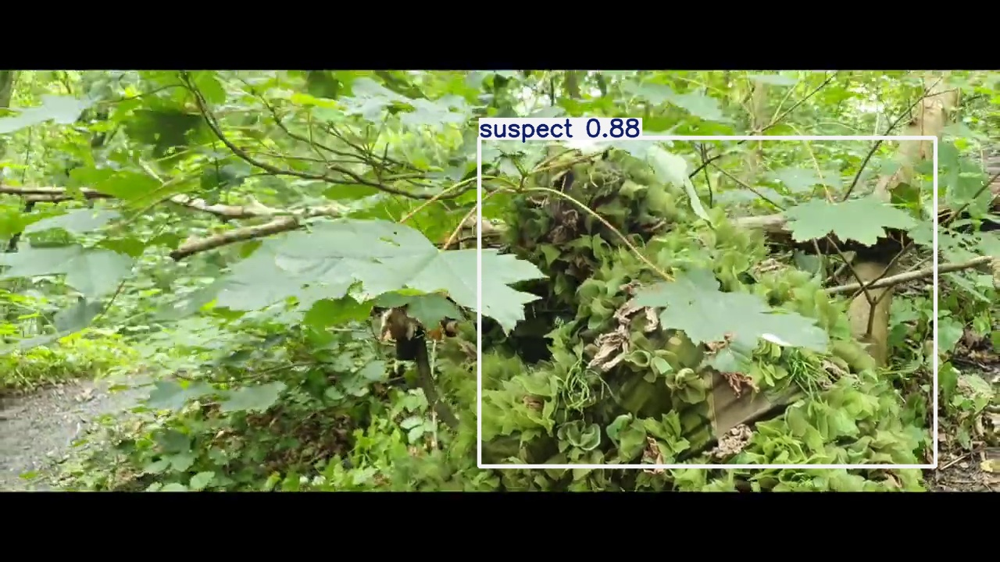


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/69.jpg: 384x640 1 Aummunitions, 1 suspect, 7.8ms
Speed: 1.8ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


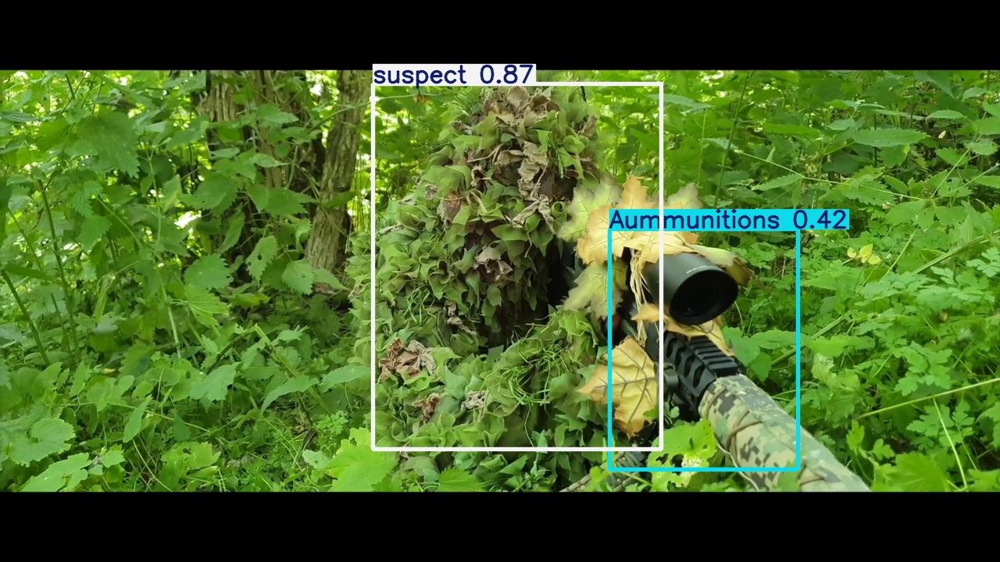


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/39.jpg: 480x640 1 Person, 63.5ms
Speed: 4.4ms preprocess, 63.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


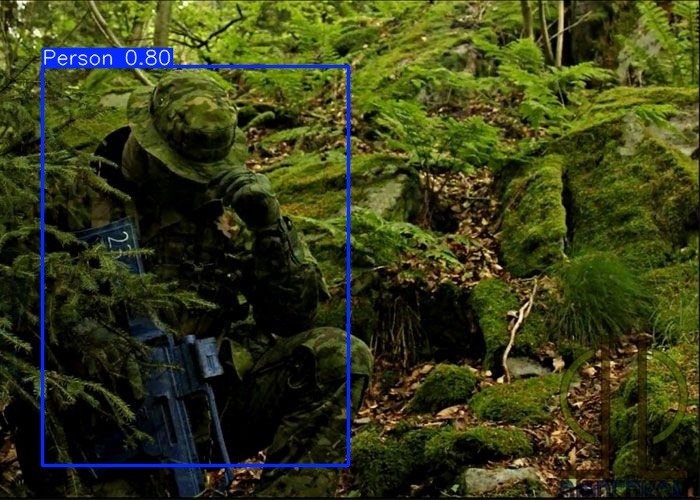


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/64.jpg: 384x640 1 Person, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


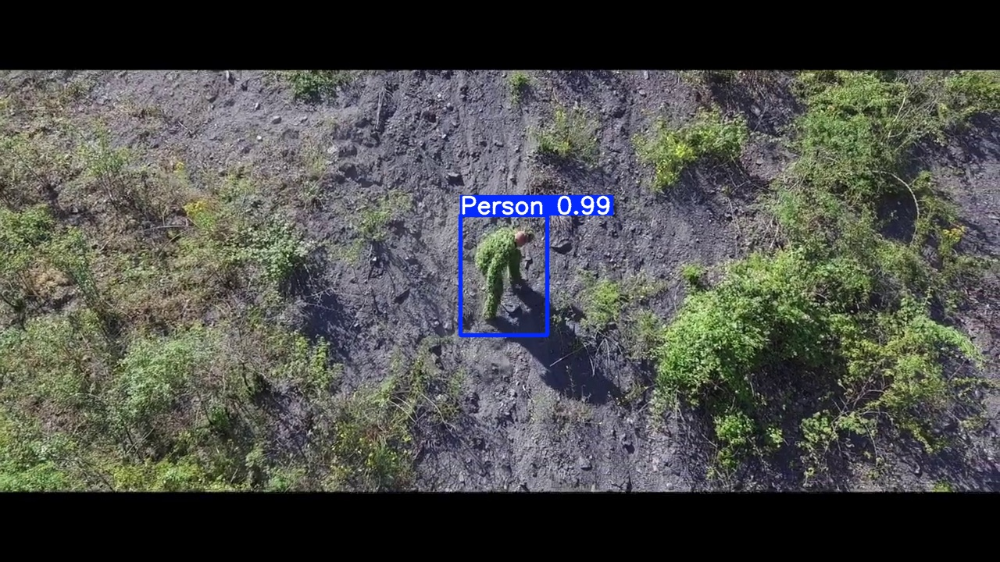


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/46.jpg: 640x640 1 Person, 8.6ms
Speed: 3.6ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


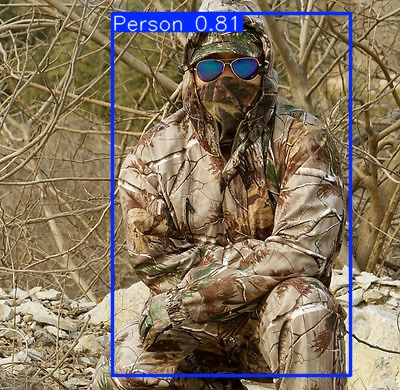

📌 Validating YOLOv8s on random images...

image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/55.jpg: 384x640 1 suspect, 58.1ms
Speed: 1.8ms preprocess, 58.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


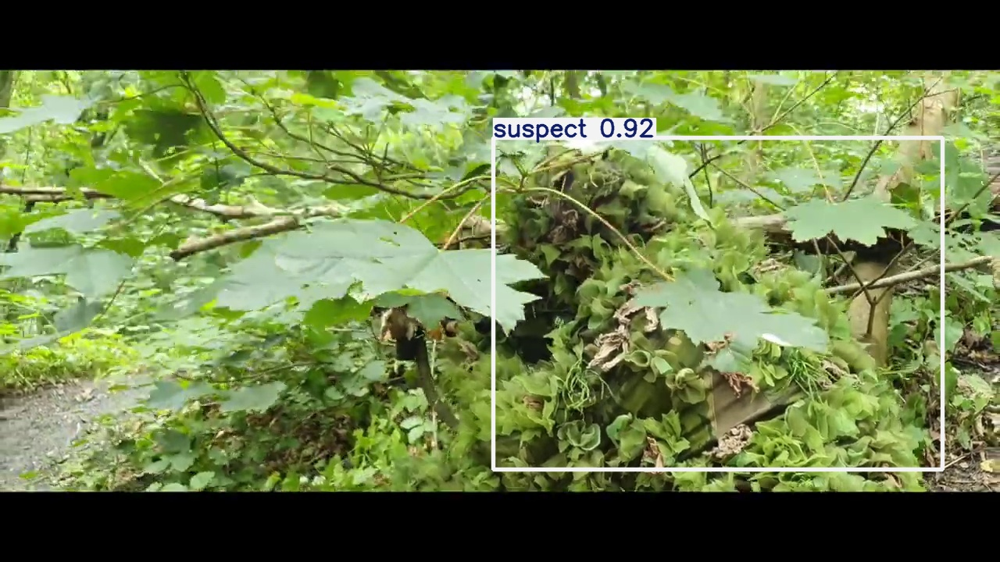


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/69.jpg: 384x640 1 suspect, 8.6ms
Speed: 2.0ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


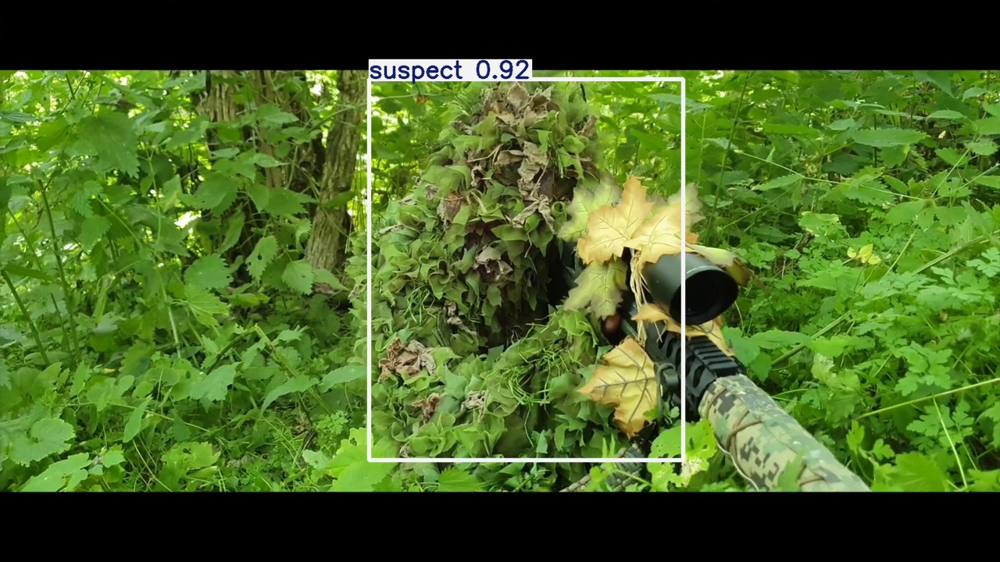


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/39.jpg: 480x640 1 Person, 1 Aummunitions, 121.6ms
Speed: 3.8ms preprocess, 121.6ms inference, 4.4ms postprocess per image at shape (1, 3, 480, 640)


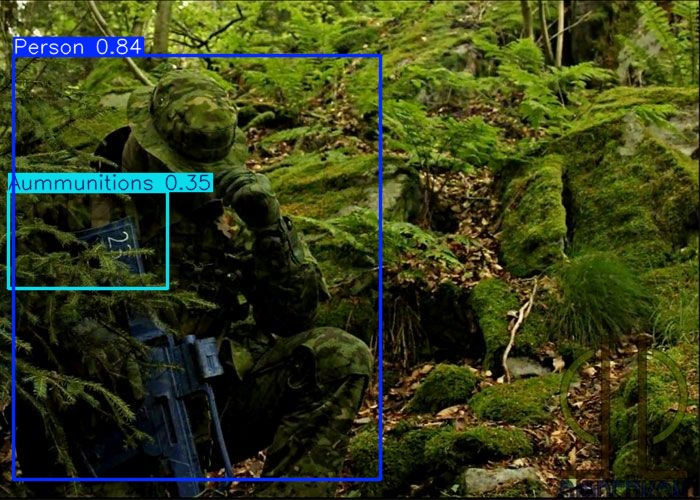


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/64.jpg: 384x640 1 Person, 36.6ms
Speed: 3.7ms preprocess, 36.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


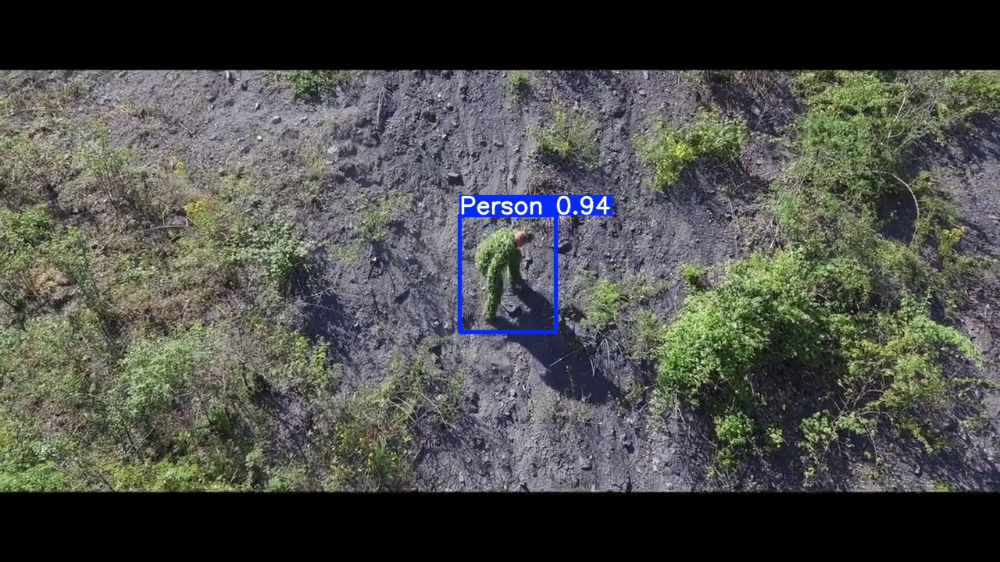


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/46.jpg: 640x640 1 Person, 24.2ms
Speed: 7.0ms preprocess, 24.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


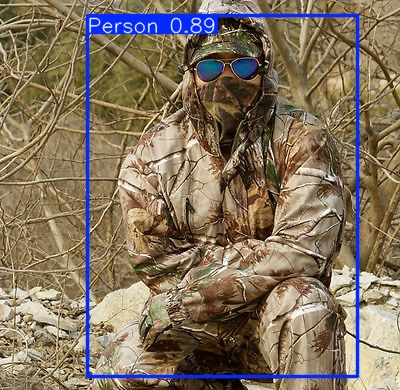

📌 Validating YOLOv8m on random images...

image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/55.jpg: 384x640 1 suspect, 78.3ms
Speed: 1.8ms preprocess, 78.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


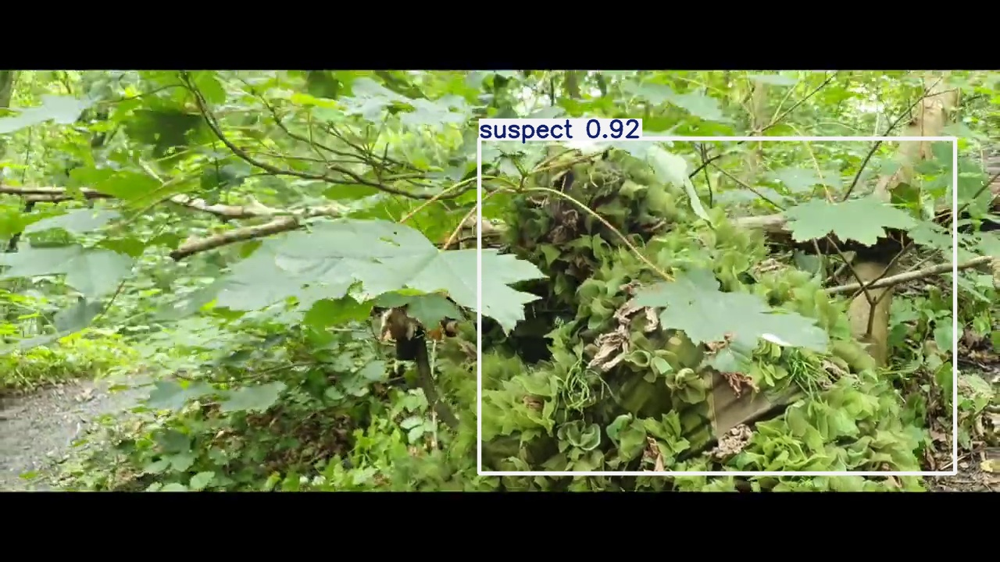


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/69.jpg: 384x640 1 Aummunitions, 1 suspect, 10.7ms
Speed: 2.0ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


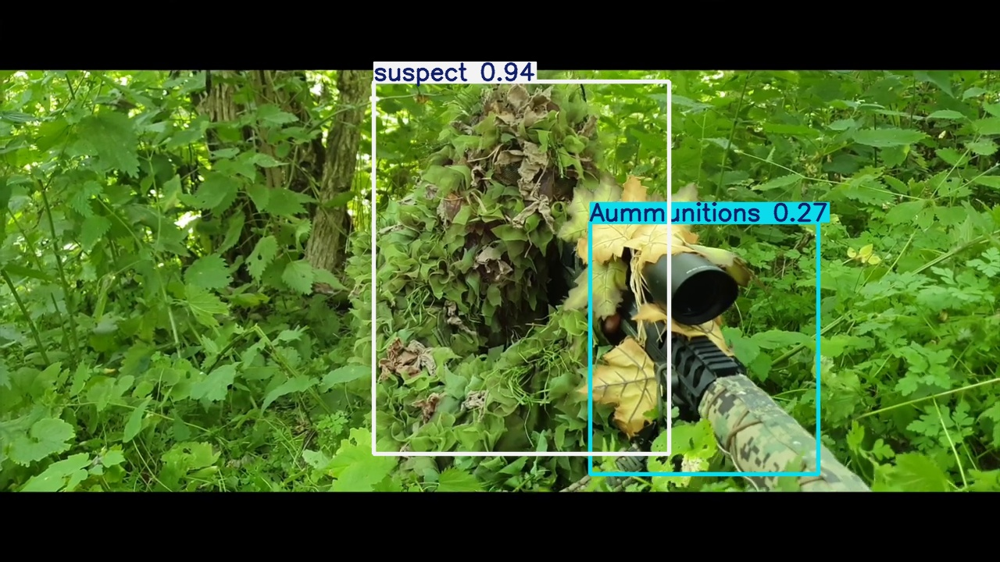


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/39.jpg: 480x640 1 Person, 1 Aummunitions, 79.6ms
Speed: 2.5ms preprocess, 79.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


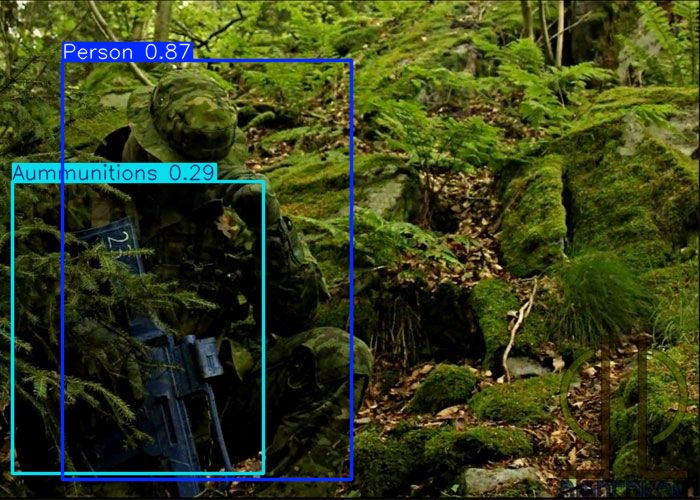


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/64.jpg: 384x640 1 Person, 11.6ms
Speed: 1.9ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


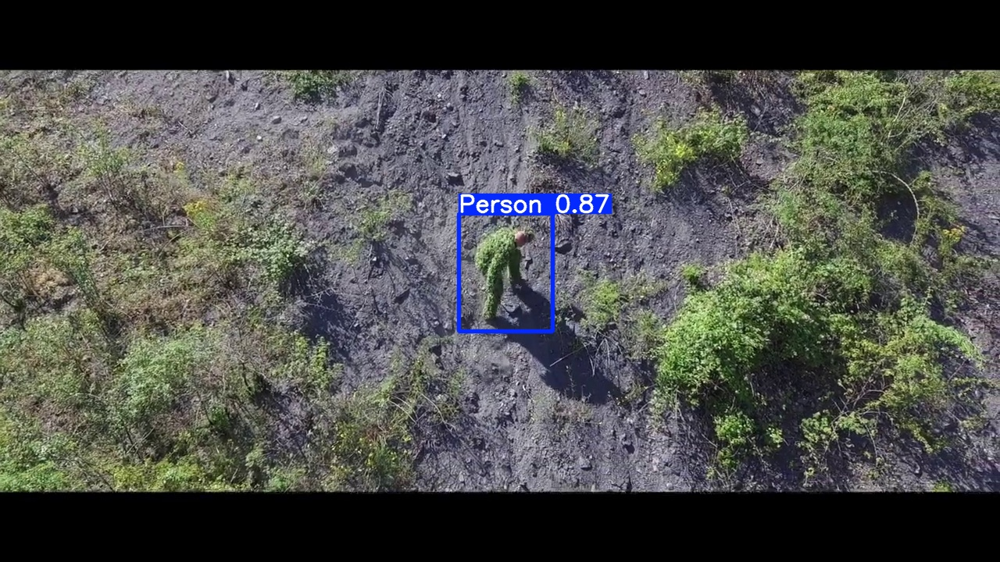


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/46.jpg: 640x640 1 Person, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


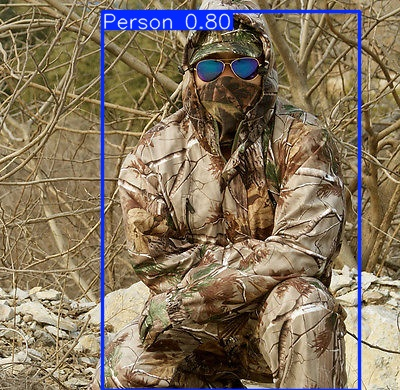

📌 Validating YOLOv8l on random images...

image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/55.jpg: 384x640 1 Aummunitions, 2 suspects, 176.9ms
Speed: 4.4ms preprocess, 176.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


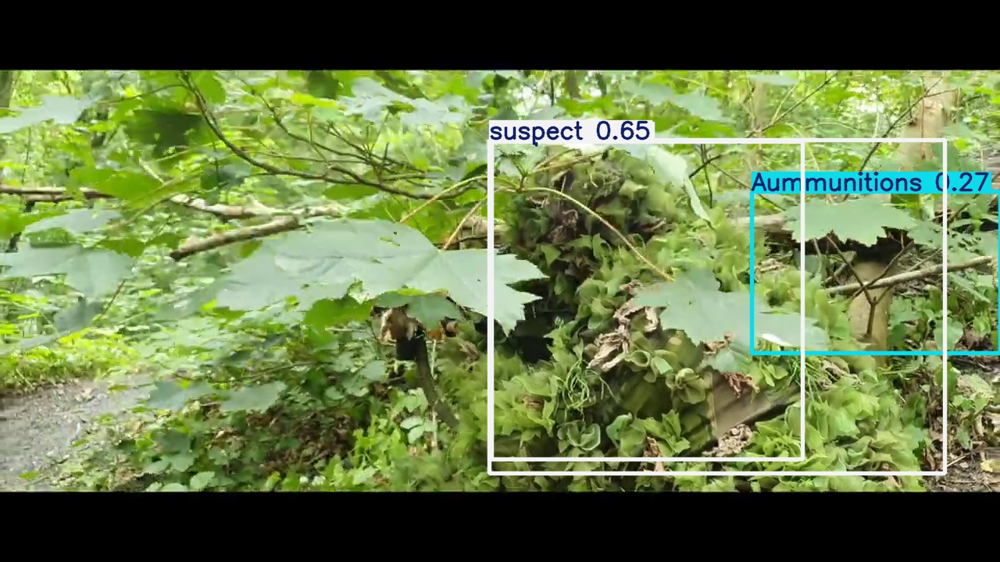


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/69.jpg: 384x640 1 Person, 1 Aummunitions, 1 suspect, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


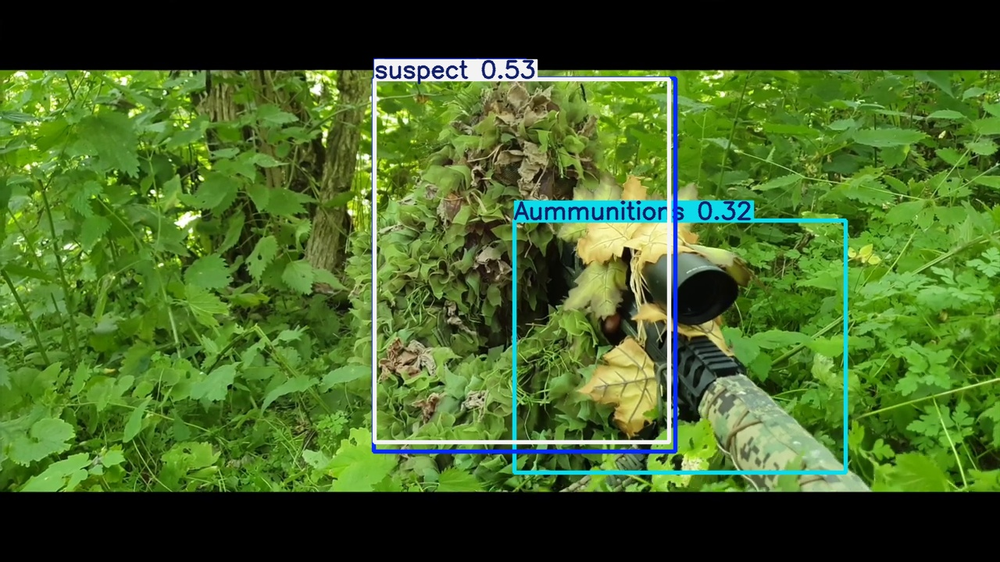


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/39.jpg: 480x640 1 Person, 66.6ms
Speed: 3.8ms preprocess, 66.6ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


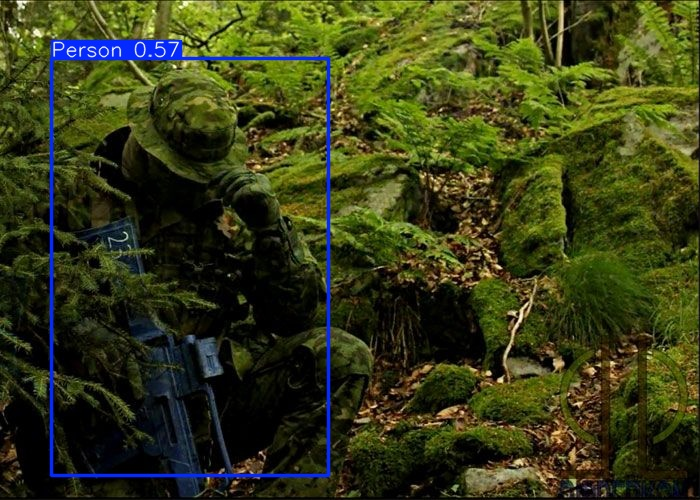


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/64.jpg: 384x640 1 Person, 13.5ms
Speed: 1.9ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


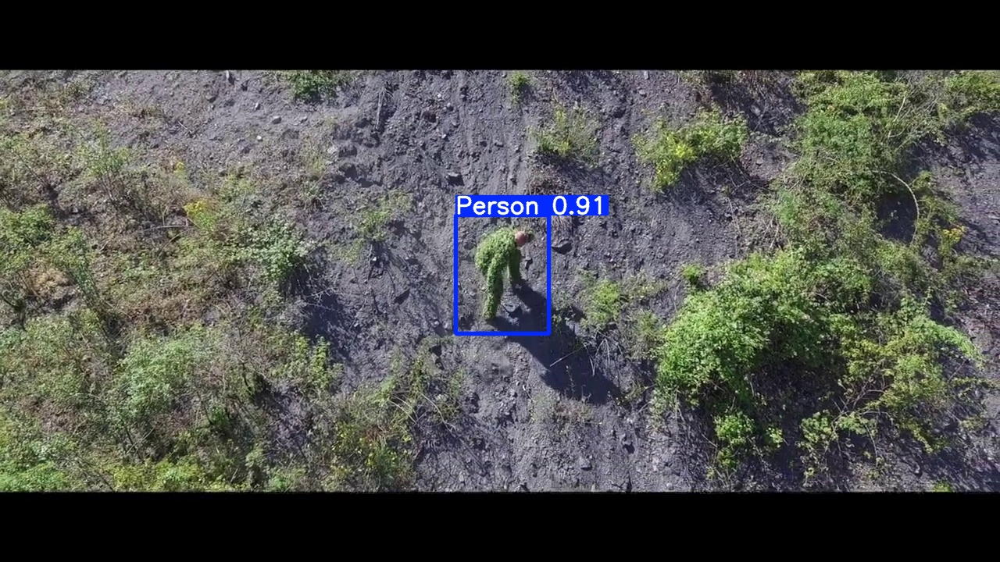


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/46.jpg: 640x640 1 Person, 13.0ms
Speed: 2.8ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


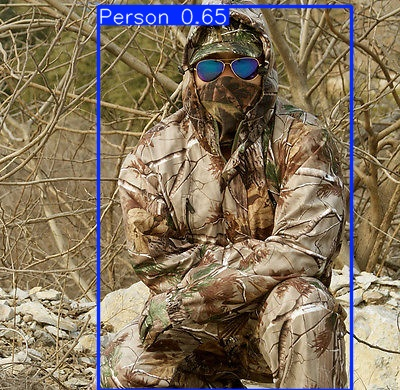

📌 Validating YOLOv8x on random images...

image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/55.jpg: 384x640 1 suspect, 69.6ms
Speed: 1.8ms preprocess, 69.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


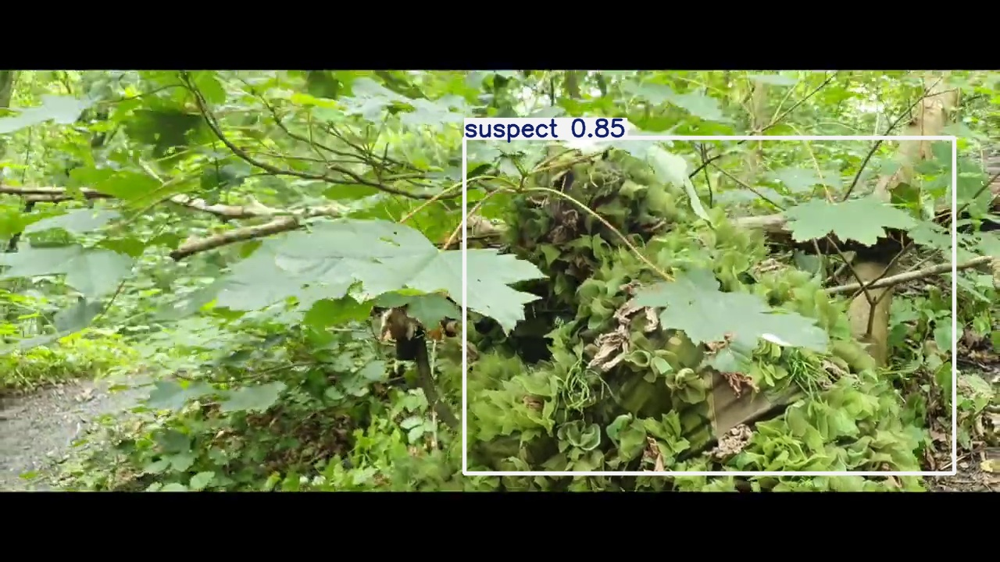


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/69.jpg: 384x640 1 suspect, 12.8ms
Speed: 1.9ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


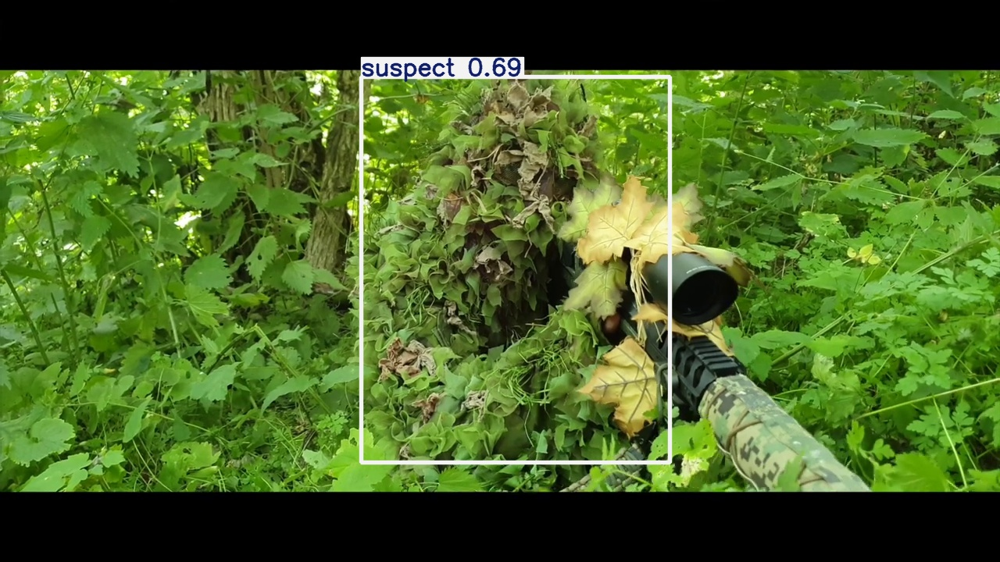


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/39.jpg: 480x640 1 Person, 69.9ms
Speed: 2.5ms preprocess, 69.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


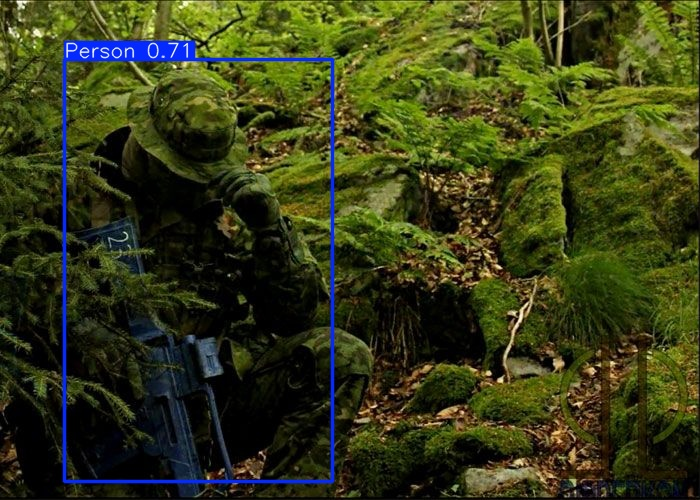


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/64.jpg: 384x640 1 Person, 25.5ms
Speed: 1.8ms preprocess, 25.5ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)


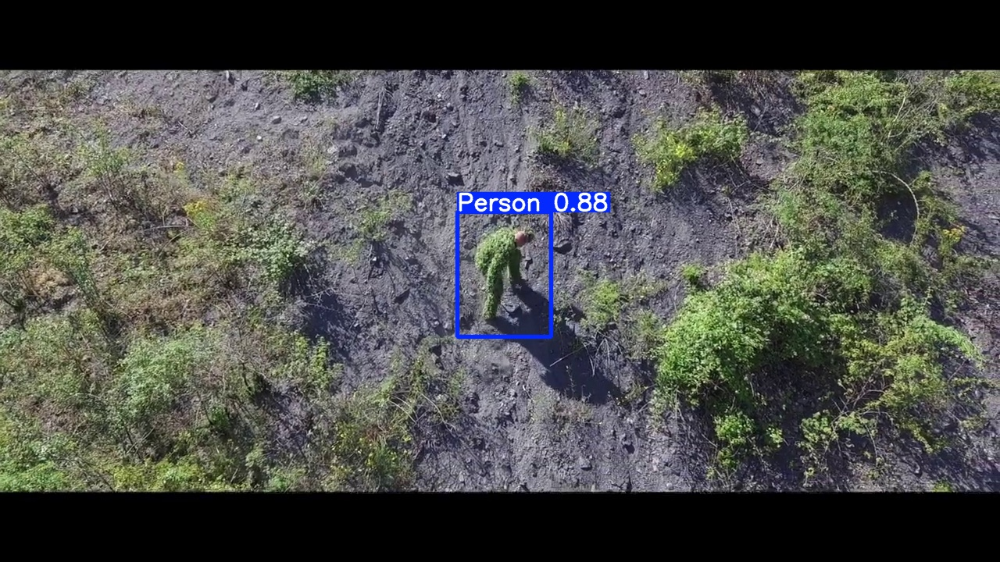


image 1/1 /content/drive/My Drive/YoloV8Final/data/images/val/46.jpg: 640x640 1 Person, 49.1ms
Speed: 6.6ms preprocess, 49.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


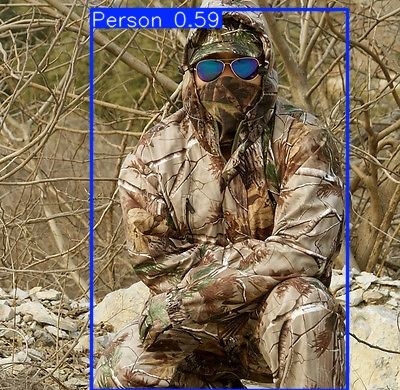

In [ ]:
from IPython.display import display, Image
import random
import os

# Get a few random images for validation
val_samples = random.sample(val_images, min(5, len(val_images)))  # Pick up to 5 images for validation

for variant in variants:
    print(f"📌 Validating YOLOv8{variant} on random images...")

    model = YOLO(os.path.join(MODEL_SAVE_PATH, f"yolov8{variant}.pt"))

    for img in val_samples:
        img_path = os.path.join(IMAGES_PATH_VAL, img)
        results = model(img_path)  # Run inference

        # Save and display the result
        save_path = os.path.join(MODEL_SAVE_PATH, f"val_{variant}_{img}")
        results[0].save(save_path)  # Fix: Access the first result in the list

        display(Image(filename=save_path))  # Show detection results


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Image found: /content/drive/MyDrive/YoloV8Final/test_image5.jpg

📌 Running YOLOv8n on the test image...

image 1/1 /content/drive/MyDrive/YoloV8Final/test_image5.jpg: 448x640 2 Persons, 1 Aummunitions, 182.4ms
Speed: 4.1ms preprocess, 182.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
✅ YOLOv8n output saved at: /content/drive/My Drive/YoloV8Final/output_yolov8n.jpg


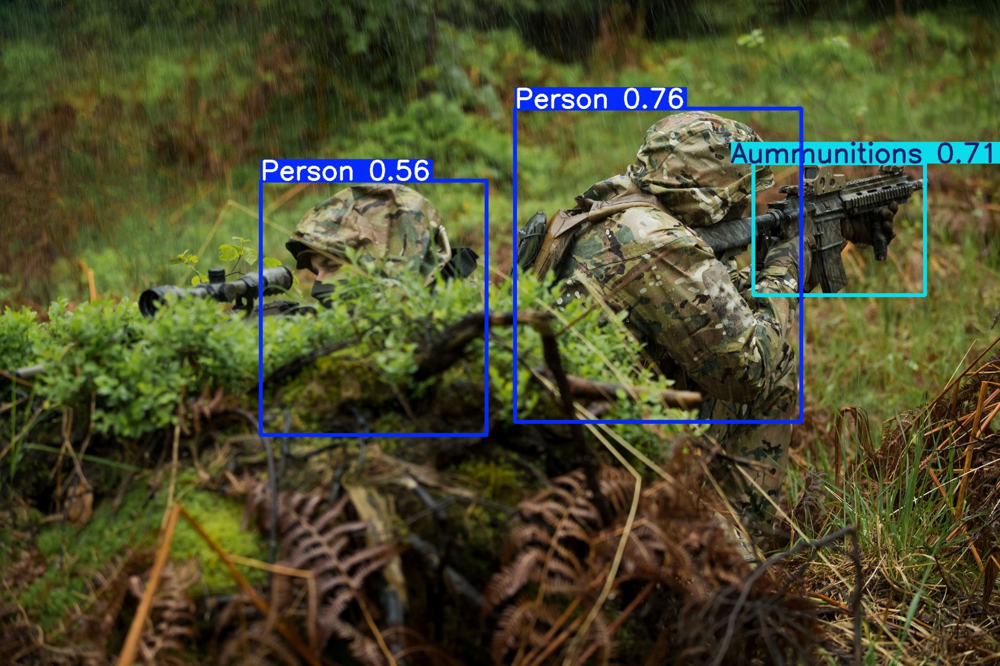


📌 Running YOLOv8s on the test image...

image 1/1 /content/drive/MyDrive/YoloV8Final/test_image5.jpg: 448x640 1 Person, 2 Aummunitionss, 1 suspect, 450.1ms
Speed: 3.3ms preprocess, 450.1ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)
✅ YOLOv8s output saved at: /content/drive/My Drive/YoloV8Final/output_yolov8s.jpg


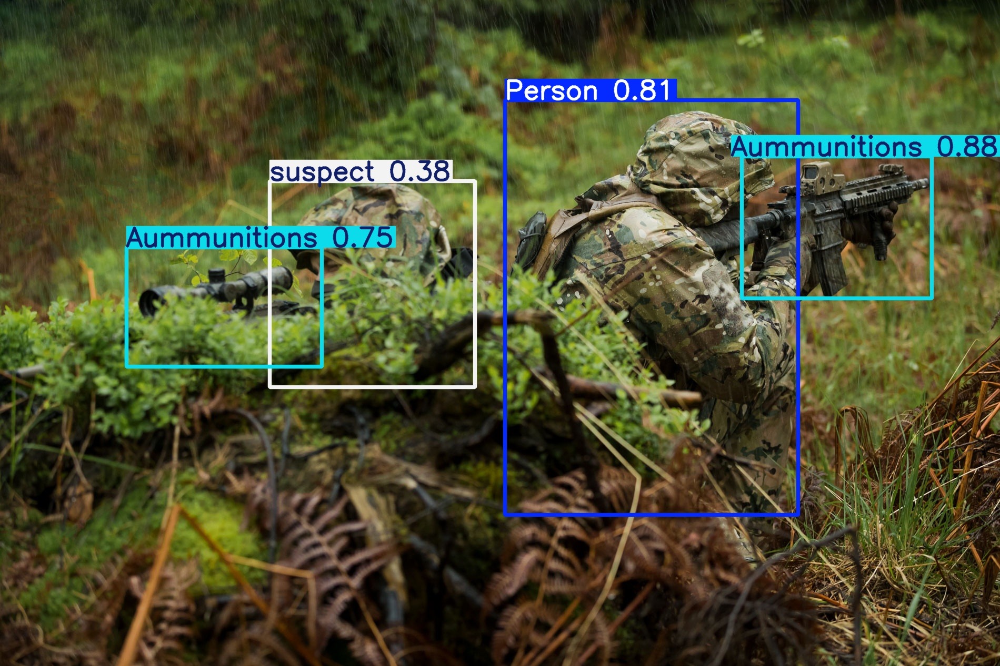


📌 Running YOLOv8m on the test image...

image 1/1 /content/drive/MyDrive/YoloV8Final/test_image5.jpg: 448x640 1 Person, 2 Aummunitionss, 1 suspect, 1243.3ms
Speed: 5.2ms preprocess, 1243.3ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)
✅ YOLOv8m output saved at: /content/drive/My Drive/YoloV8Final/output_yolov8m.jpg


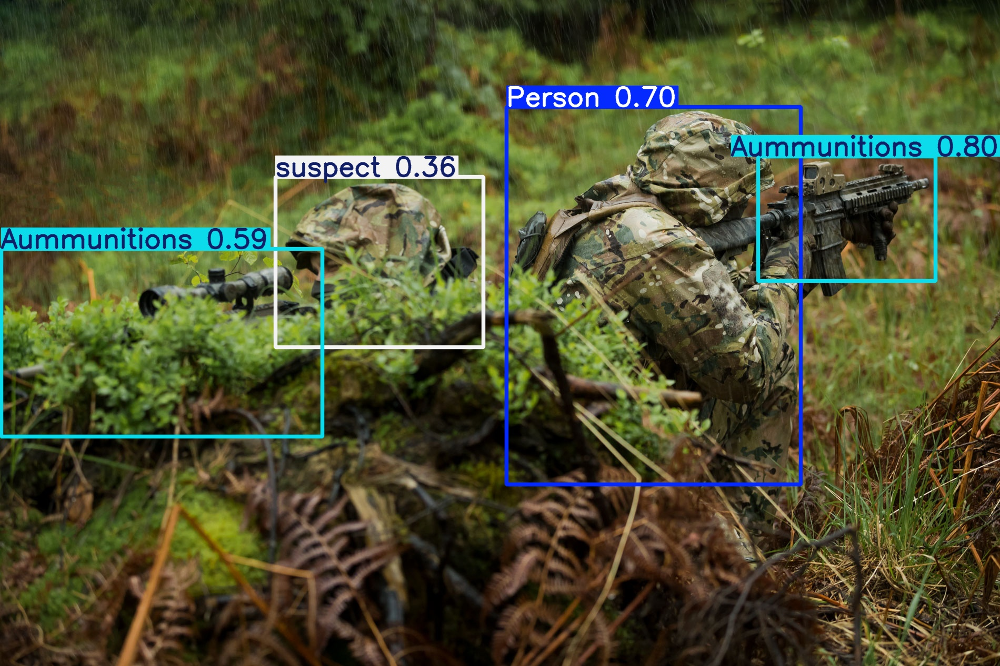


📌 Running YOLOv8l on the test image...

image 1/1 /content/drive/MyDrive/YoloV8Final/test_image5.jpg: 448x640 1 Person, 3 Aummunitionss, 2947.5ms
Speed: 5.7ms preprocess, 2947.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)
✅ YOLOv8l output saved at: /content/drive/My Drive/YoloV8Final/output_yolov8l.jpg


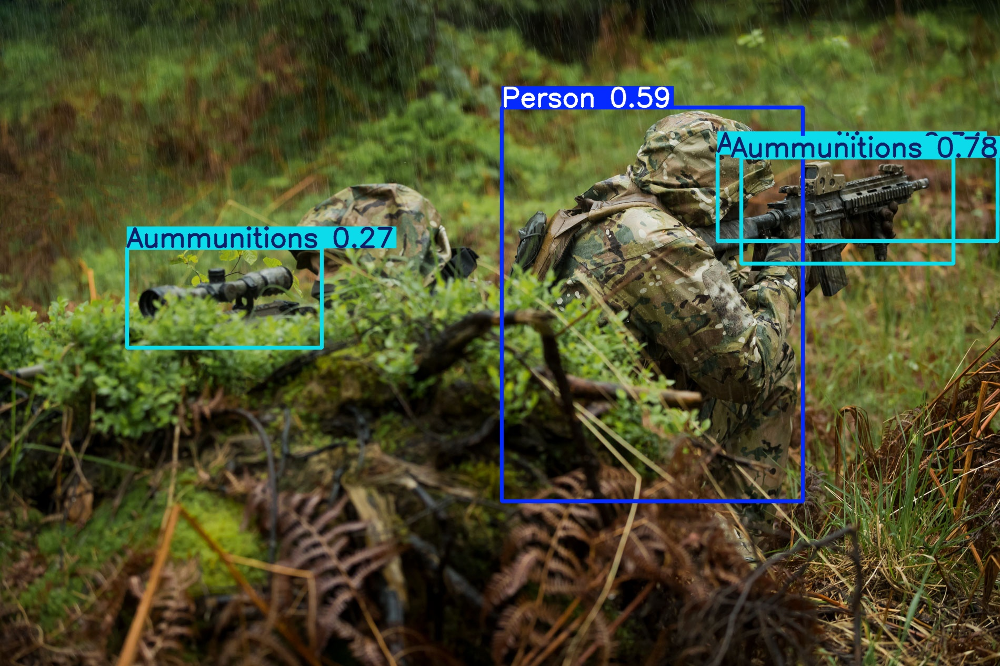


📌 Running YOLOv8x on the test image...

image 1/1 /content/drive/MyDrive/YoloV8Final/test_image5.jpg: 448x640 1 Person, 2 Aummunitionss, 3234.8ms
Speed: 5.6ms preprocess, 3234.8ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)
✅ YOLOv8x output saved at: /content/drive/My Drive/YoloV8Final/output_yolov8x.jpg


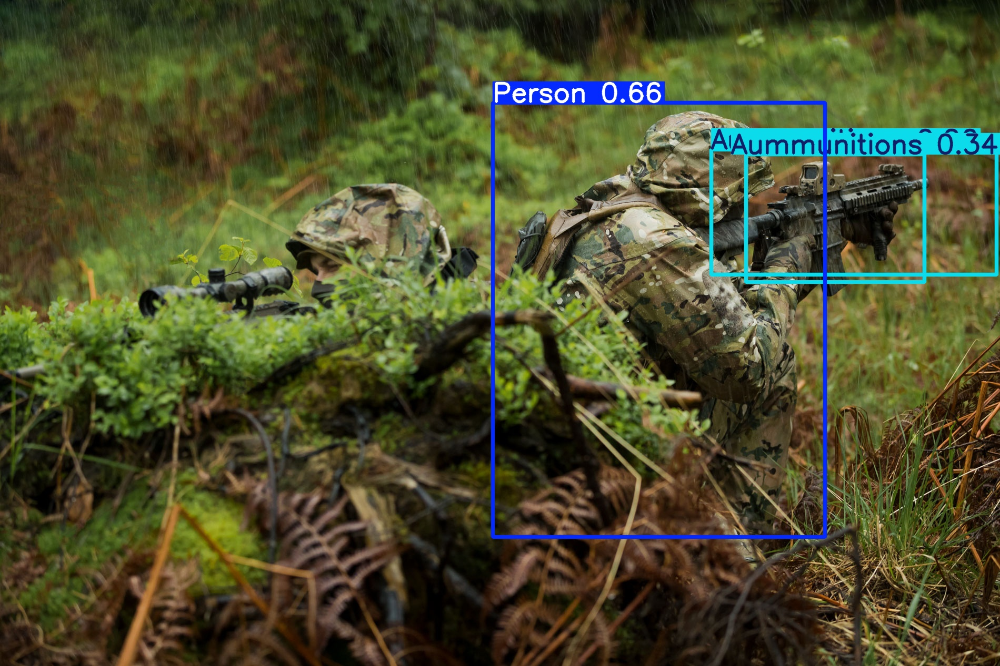

In [ ]:
# ===========================
# 🔥 STEP 1: SETUP & IMPORTS
# ===========================
from google.colab import drive
from ultralytics import YOLO
from IPython.display import display, Image
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
MODEL_SAVE_PATH = "/content/drive/My Drive/YoloV8Final/trained_models"  # Change if models are in a different folder

# List of YOLOv8 variants
variants = ["n", "s", "m", "l", "x"]

# ===========================
# 📌 STEP 2: UPLOAD IMAGE PATH
# ===========================
# Provide the full path of the image in Google Drive
image_path = "/content/drive/MyDrive/YoloV8Final/test_image5.jpg"  # CHANGE THIS TO YOUR IMAGE PATH

# Check if the image exists
if not os.path.exists(image_path):
    print(f"Error: Image '{image_path}' not found. Please check the path.")
else:
    print(f"✅ Image found: {image_path}")

# ===========================
# 🚀 STEP 3: RUN YOLOv8 MODELS
# ===========================
for variant in variants:
    print(f"\n📌 Running YOLOv8{variant} on the test image...")

    # Load the trained model
    model_path = os.path.join(MODEL_SAVE_PATH, f"yolov8{variant}.pt")

    if not os.path.exists(model_path):
        print(f"❌ Model '{model_path}' not found! Skipping YOLOv8{variant}...")
        continue

    model = YOLO(model_path)  # Load model
    results = model(image_path)  # Run inference

    # Save output image
    save_path = f"/content/drive/My Drive/YoloV8Final/output_yolov8{variant}.jpg"
    results[0].save(save_path)  # Save detection result

    # Show output image
    print(f"✅ YOLOv8{variant} output saved at: {save_path}")
    display(Image(filename=save_path))  # Display output
